# Pengenalan Data Audio/Voice

Secara langsung maupun tidak langsung, kita selalu terhubung dengan audio. Otak terus memproses dan memahami data audio, serta memberi informasi tentang lingkungan sekitar.

***Contoh sederhananya adalah percakapan Kita dengan orang lain yang kita lakukan setiap hari.***

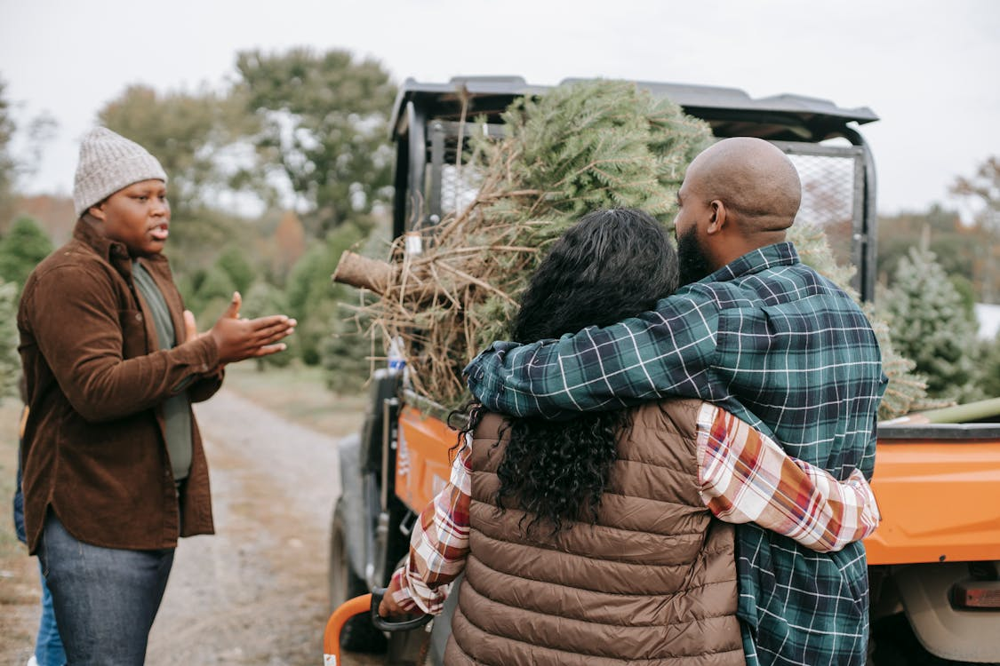

## Apa itu data audio?

Data Audio adalah representasi digital dari gelombang suara (sinyal kontinu). Artinya mengandung nilai sinyal yang tak terhingga jumlahnya dalam waktu tertentu. Hal ini menimbulkan masalah bagi perangkat digital yang membutuhkan rangkaian terbatas. Agar dapat diproses, disimpan, dan ditransmisikan oleh perangkat digital, gelombang suara kontinu perlu diubah menjadi serangkaian nilai diskrit.

Mari kita lihat bagaimana kita beralih dari sinyal kontinu ke representasi digital ini.

1. Sinyal analog pertama-tama ditangkap oleh mikrofon, yang kemudian mengubah gelombang suara menjadi sinyal listrik.

2. Sinyal listrik ini kemudian didigitalkan oleh Konverter Analog ke Digital untuk mendapatkan representasi digital melalui pengambilan sampel.

***Jadi, bisakah suara di sekitar kita ditangkap dan diubah jadi sesuatu yang berguna? Tentu saja bisa! Ada alat yang bisa merekam suara dan mengubahnya ke dalam format yang bisa dibaca komputer.***

Contoh format ini adalah



1.   format wav  (File Audio Bentuk Gelombang)
2.   format mp3 (MPEG-1 Audio Layer 3)
3.   format WMA (Windows Media Audio)
4.   format FLAC (Free Lossless Audio Codec)
5.   format OGG (Ogg Vorbis)
6.   format M4A (MPEG-4 Audio)
7.   format AIFF (Audio Interchange File Format)
8.   format RAW (Raw Audio Data)



Coba bayangin deh bentuk suara itu gimana. Intinya, suara itu cuma data gelombang yang naik turun terus. Kalau dilihat, bentuknya seperti ini.

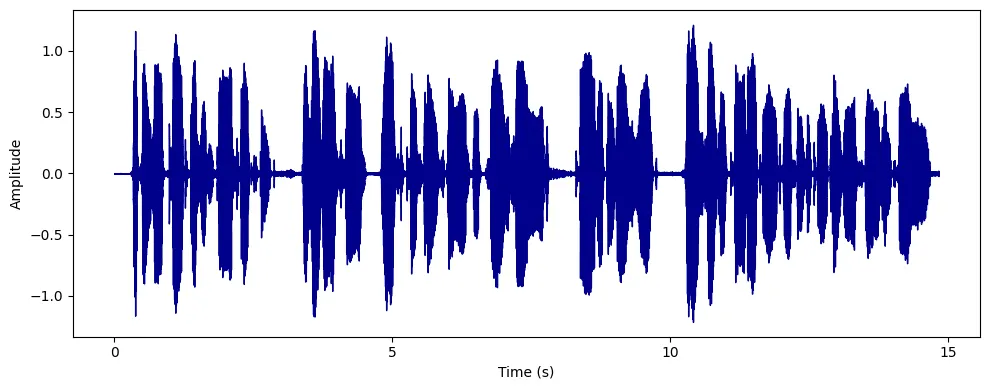

Jadi, bentuk suara yang naik turun di atas, dalam dunia audio digital disebut **Waveform** (Bentuk Gelombang). Sumbu horizontal (X) mewakili waktu, sedangkan sumbu vertikal (Y) mewakili amplitudo (Kekuatan atau tekanan sinyal suara pada saat itu)

***Semakin tinggi, semakin keras suaranya. Begitupun sebaliknya. Semakin banyak gelombang yang berulang dalam satu detik, semakin tinggi nadanya (frekuensi tinggi).***

# Karakteristik Data Audio

Data audio memiliki beberapa karakteristik utama yang mempengaruhi kualitas dan kegunaannya.

Karakteristik-karakteristik ini dijelaskan di bawah ini:

Berikut versi **ringkasnya**:

1. **Laju Pengambilan Sampel (Sampling Rate)** – Jumlah cuplikan audio per detik (kHz); makin tinggi makin detail tapi berkas lebih besar. Contoh: 16 kHz untuk pengenalan suara AI.

2. **Kedalaman Bit (Bit Depth)** – Menentukan presisi tiap sampel; makin tinggi makin luas rentang suara. Contoh: 24-bit untuk musik AI.

3. **Saluran (Channel)** – Jumlah trek audio: mono (1) untuk kejelasan, stereo (2) untuk efek ruang.

4. **Rentang Dinamis (Dynamic Range)** – Selisih antara suara paling pelan dan paling keras; perlu normalisasi agar tidak terpotong.

5. **Frekuensi (Frequency)** – Menunjukkan tinggi nada (Hz); manusia mendengar 20 Hz–20 kHz. AI biasanya menyaring frekuensi di bawah 300 Hz untuk fokus pada ucapan.

Properti ini menentukan seberapa akurat audio merepresentasikan suara dunia nyata dan memengaruhi langkah praproses seperti pengurangan noise atau ekstraksi fitur.

# Aplikasi Pemrosesan Data Audio

Apa saja potensi aplikasi pemrosesan audio?  Ini beberapa contohnya:

1. Mengatur koleksi lagu berdasarkan ciri khas musiknya (misalnya genre atau temponya).

2. Kasih rekomendasi lagu untuk diputar di radio.

3. Mencari tahu judul lagu dari suaranya (kayak aplikasi Shazam).

4. Mengolah atau bahkan bikin suara buatan, contohnya untuk asisten virtual (kayak Google Assistant) atau suara di GPS.

# Prapemrosesan Dataset Audio

Seperti halnya semua format data tak terstruktur, data audio memiliki beberapa langkah praproses yang harus diikuti sebelum disajikan untuk analisis.

Proses ini melibatkan serangkaian teknik yang diterapkan pada raw data audio untuk meningkatkan kualitasnya, mengekstrak fitur-fitur yang bermakna, dan mempersiapkannya untuk analisis lebih lanjut atau input kedalam model.

Prapemrosesan yang efektif dapat berdampak signifikan terhadap performa dan akurasi model yang dilatih pada data audio, menjadikannya aspek penting dalam pemrosesan sinyal audio.

# Teknik Prapemrosesan Audio

1. **Resampling**
   → Menyesuaikan laju sampel menjadi nilai yang seragam agar sesuai dengan kebutuhan model dan efisien secara komputasi.

2. **Pengurangan Noise (Noise Reduction)**
   → Menghilangkan noise latar belakang, interferensi, dan artefak yang tidak diinginkan agar sinyal lebih bersih.

3. **Normalisasi (Normalization)**
   → Proses mengubah nilai amplitudo sinyal secara konsisten.

4. **Penanganan Panjang yang Bervariasi**
   → Melibatkan **padding**, atau **pemotongan (trimming)** agar semua klip audio memiliki durasi yang seragam.

6. **Data Augmentasi (Data Augmentation)**
    → Time Stretching

5. **Ekstraksi Fitur (Feature Extraction)**
   → Mengubah sinyal mentah menjadi representasi yang lebih informatif, seperti:

   * **MFCC (Mel-Frequency Cepstral Coefficients)**

# LET'S GET STARTED

In [ ]:
!pip install noisereduce

## Import Library

In [ ]:
import librosa
import numpy as np
import noisereduce as nr
import matplotlib.pyplot as plt
from IPython.display import Audio
import torch
import math

## Preprocessing

### 1. Resampling

Donwload dulu data audionya di sini [Audio](https://drive.google.com/file/d/1S7OQ2X8YqiIgYBjXUAZnBeMq2USO0kkj/view?usp=sharing)

#### **Buat function untuk melihat plot**

In [ ]:
def plot_frequency_only(audio, sr, title):
    fft = np.fft.fft(audio)
    magnitude = np.abs(fft)
    freq = np.linspace(0, sr, len(magnitude))
    half = len(freq) // 2
    freq = freq[:half]

    print(f"Sample Rate (sr): {sr} Hz")
    print(" ")

    plt.figure(figsize=(10, 3))
    plt.plot(freq, magnitude[:half], color='blue')  # masih butuh magnitude utk plotting
    plt.title(f"{title}\nSample Rate: {sr} Hz")
    plt.xlabel("Frekuensi (Hz)")
    plt.ylabel("Amplitudo)")
    plt.grid(True, alpha=0.3)
    plt.show()

#### **Load Audio**

Kalian bisa didokumentasi [librosa](https://librosa.org/doc/latest/core.html#audio-loading), mencoba fungsi-fungsi bawaan librosa

Sample Rate (sr): 48000 Hz
 


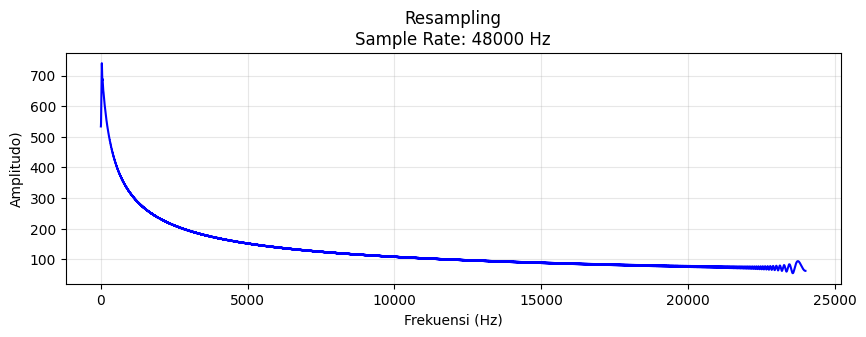

In [ ]:
y, sr = librosa.load("/content/resampling.wav", sr=None)
plot_frequency_only(y, sr, "Resampling")
print(" ")
display(Audio(y, rate=sr))

#### **Downsampling**

Sample Rate (sr): 10000 Hz
 


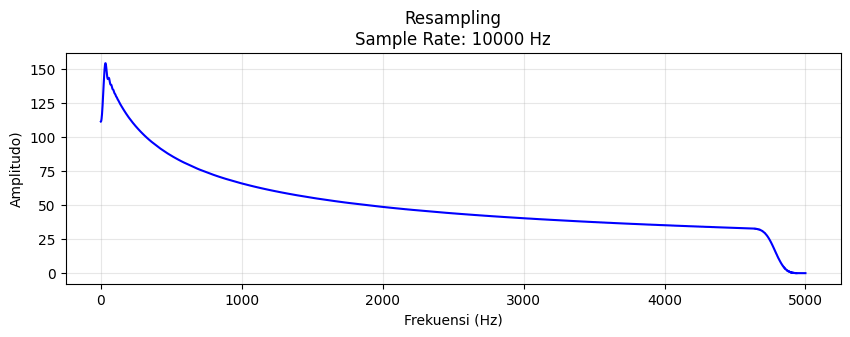

In [ ]:
target_sr = 10000

y_downsampled = librosa.resample(y, orig_sr=sr, target_sr=target_sr)
plot_frequency_only(y_downsampled, target_sr, "Resampling")
print(" ")
display(Audio(y_downsampled, rate=target_sr))

#### **Upsampling**

Sample Rate (sr): 32000 Hz
 


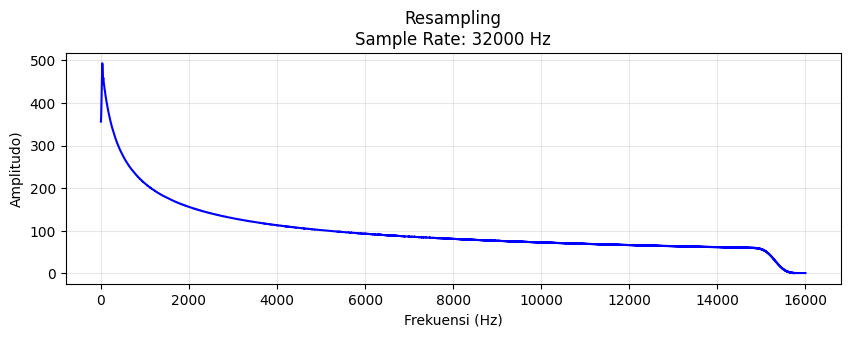

In [ ]:
target_sr = 32000

y_upsampled = librosa.resample(y, orig_sr=sr, target_sr=target_sr)
plot_frequency_only(y_upsampled, target_sr, "Resampling")
print(" ")
display(Audio(y_upsampled, rate=target_sr))

### 2. Pengurangan Noise

Donwload dulu data audionya di sini [Audio](https://drive.google.com/file/d/13FMSNU9_IyOv9h6G-xRA4aJ7qZBQevyH/view?usp=drive_link)

#### **Buat function untuk melihat plot**

In [ ]:
# Fungsi untuk menampilkan plot waveform dari audio
def plot_waveform(audio, sr, title="Waveform"):
    plt.figure(figsize=(10, 4))
    librosa.display.waveshow(audio, sr=sr)
    plt.title(title)
    plt.show()

# Fungsi untuk preview audioc`
def preview_audio(audio, sr):
    return Audio(data=audio, rate=sr)

Original Sample Rate: 48000
 


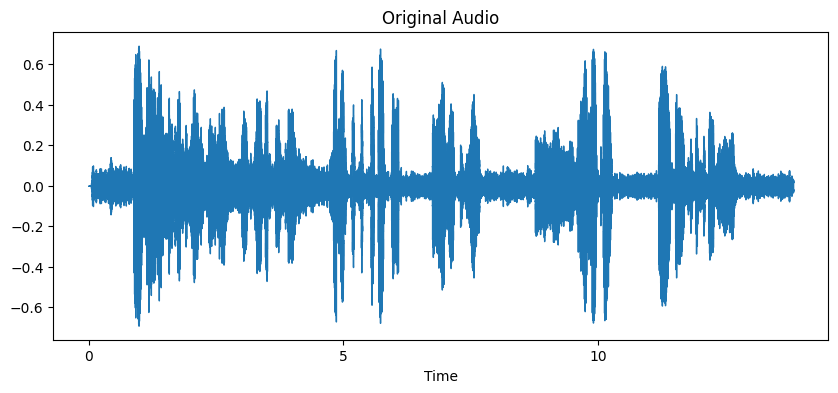

In [ ]:
# Load Audio File
audio_file = '/content/audio.mp3'
audio_data, sample_rate = librosa.load(audio_file, sr=None)
print(f'Original Sample Rate: {sample_rate}')
print(" ")
plot_waveform(audio_data, sample_rate, title="Original Audio")
print(" ")
display(preview_audio(audio_data, sample_rate))

 
After Noise Reduction
 


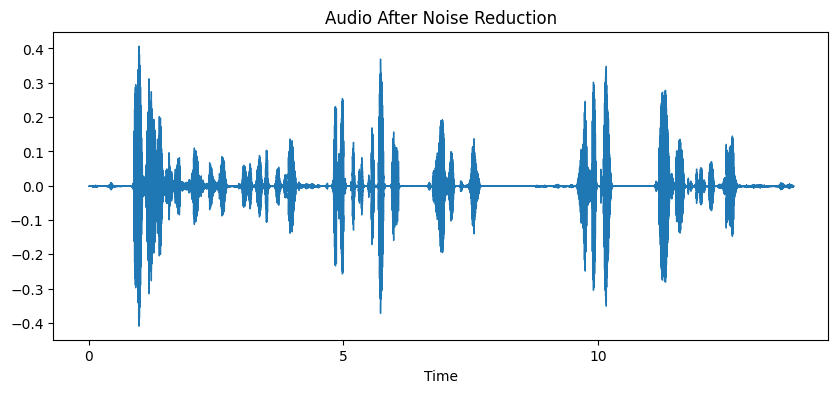

In [ ]:
# Noise Reduction
audio_data_reduced_noise = nr.reduce_noise(y=audio_data , sr=48000)
print(" ")
print(f'After Noise Reduction')
print(" ")
plot_waveform(audio_data_reduced_noise, 48000, title="Audio After Noise Reduction")
print(" ")
display(preview_audio(audio_data_reduced_noise, 48000))

### 3. Normalisasi

Intinya normalisasi berujuan agar suara terdengar seimbang dan jelas di berbagai perangkat tanpa perlu sering-sering menaikkan dan menurunkan volume.

Pada dasarnya, ada dua jenis normalisasi:

##### Peak Normalization

Normalisasi puncak melihat sinyal tertinggi dari sinyal audio.

Tujuannya: menaikkan seluruh sinyal hingga puncaknya mendekati 0 dB, tanpa melewati batas itu.

In [ ]:
# === Load audio ===
y, sr = librosa.load("/content/audio.mp3", sr=None)

🔹 Nilai puncak awal (amplitudo): 0.6923
🔹 Nilai puncak awal dalam dBFS : -3.19 dBFS
 


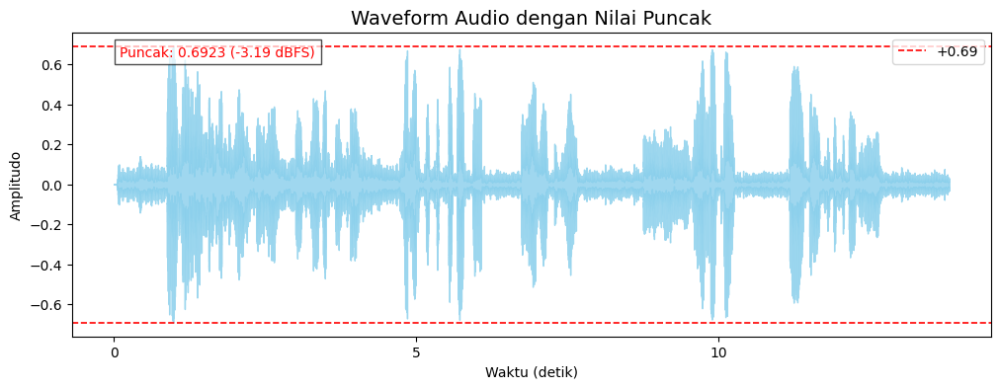

In [ ]:

# === Cari nilai puncak awal ===
peak_awal = np.max(np.abs(y))
peak_dbfs = 20 * np.log10(peak_awal)

# === Plot waveform ===
plt.figure(figsize=(12, 4))
librosa.display.waveshow(y, sr=sr, alpha=0.8, color='skyblue')
plt.title("Waveform Audio dengan Nilai Puncak", fontsize=14)
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")

# === Cetak hasil di terminal ===
print(f"🔹 Nilai puncak awal (amplitudo): {peak_awal:.4f}")
print(f"🔹 Nilai puncak awal dalam dBFS : {peak_dbfs:.2f} dBFS")
print(" ")

# Tampilkan garis horizontal di posisi puncak dan teks nilainya
plt.axhline(y=peak_awal, color='r', linestyle='--', linewidth=1.2, label=f'+{peak_awal:.2f}')
plt.axhline(y=-peak_awal, color='r', linestyle='--', linewidth=1.2)
plt.text(0.1, peak_awal - 0.05, f'Puncak: {peak_awal:.4f} ({peak_dbfs:.2f} dBFS)',
         color='red', fontsize=10, bbox=dict(facecolor='white', alpha=0.7))

plt.legend()
plt.show()

# === Audio Player ===
print(" ")
Audio(y, rate=sr)


🔹 Nilai puncak setelah normalisasi (amplitudo): 1.0000
🔹 Nilai puncak setelah normalisasi dalam dBFS : 0.00 dBFS
 


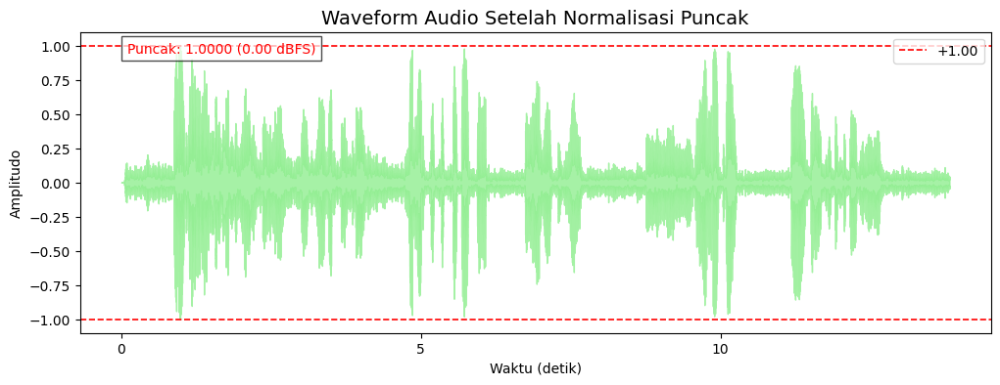

In [ ]:
# Cari faktor skala untuk membuat puncak mencapai 1.0 (0 dBFS)
target_peak = 1.0
scaling_factor = target_peak / peak_awal
y_norm = y * scaling_factor

# === Hitung ulang nilai puncak setelah normalisasi ===
peak_akhir = np.max(np.abs(y_norm))
peak_dbfs_akhir = 20 * np.log10(peak_akhir)

# === Plot waveform setelah normalisasi ===
plt.figure(figsize=(12, 4))
librosa.display.waveshow(y_norm, sr=sr, alpha=0.8, color='lightgreen')
plt.title("Waveform Audio Setelah Normalisasi Puncak", fontsize=14)
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")

# === Cetak hasil di terminal ===
print(f"🔹 Nilai puncak setelah normalisasi (amplitudo): {peak_akhir:.4f}")
print(f"🔹 Nilai puncak setelah normalisasi dalam dBFS : {peak_dbfs_akhir:.2f} dBFS")
print(" ")

# Tampilkan garis horizontal di posisi puncak dan teks nilainya
plt.axhline(y=peak_akhir, color='r', linestyle='--', linewidth=1.2, label=f'+{peak_akhir:.2f}')
plt.axhline(y=-peak_akhir, color='r', linestyle='--', linewidth=1.2)
plt.text(0.1, peak_akhir - 0.05, f'Puncak: {peak_akhir:.4f} ({peak_dbfs_akhir:.2f} dBFS)',
         color='red', fontsize=10, bbox=dict(facecolor='white', alpha=0.7))

plt.legend()
plt.show()

# === Audio Player ===
print(" ")
Audio(y_norm, rate=sr)

In [ ]:
pip install pyloudnorm


In [ ]:
import pyloudnorm as pyln

🔹 Kenyaringan awal: -21.58 LUFS
 


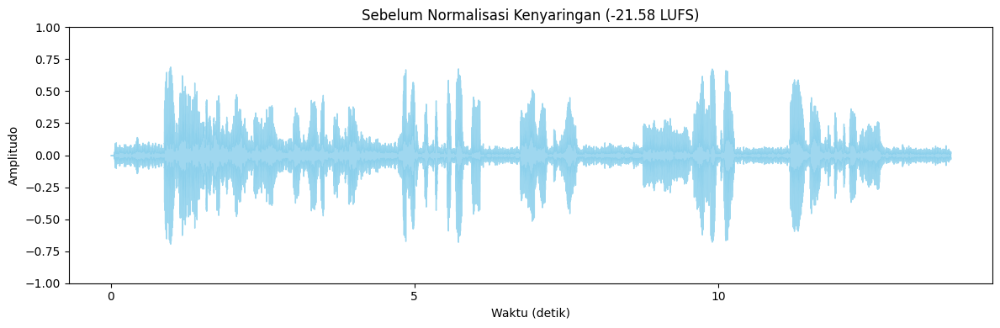

In [ ]:
# === 1. Load audio ===
y, sr = librosa.load("/content/audio.mp3", sr=None)

# === 2. Hitung LUFS awal ===
meter = pyln.Meter(sr)  # create LUFS meter
loudness_awal = meter.integrated_loudness(y)

print(f"🔹 Kenyaringan awal: {loudness_awal:.2f} LUFS")
print(" ")


# === 3. Plot sebelum normalisasi ===
plt.figure(figsize=(12, 4))
librosa.display.waveshow(y, sr=sr, alpha=0.8, color='skyblue')
plt.title(f"Sebelum Normalisasi Kenyaringan ({loudness_awal:.2f} LUFS)")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.ylim(-1, 1)
plt.tight_layout()
plt.show()

/usr/local/lib/python3.12/dist-packages/pyloudnorm/normalize.py:62: UserWarning: Possible clipped samples in output.
  warnings.warn("Possible clipped samples in output.")


 
🔹 Kenyaringan setelah normalisasi: -1.00 LUFS
 


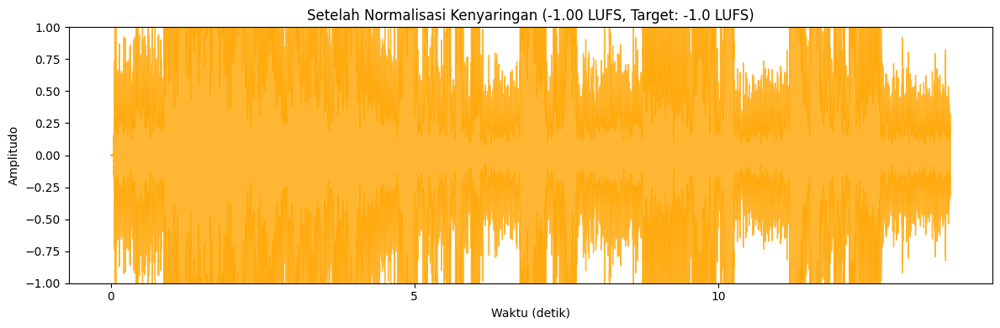

In [ ]:
# === 2. Hitung kenyaringan awal (LUFS) ===
meter = pyln.Meter(sr)
loudness_awal = meter.integrated_loudness(y)

# === 3. Normalisasi Kenyaringan ke target (misal -14 LUFS, standar YouTube) ===
target_loudness = -1.0
y_loudness_norm = pyln.normalize.loudness(y, loudness_awal, target_loudness)

# === 4. Hitung kembali LUFS setelah normalisasi ===
print(" ")
loudness_baru = meter.integrated_loudness(y_loudness_norm)
print(f"🔹 Kenyaringan setelah normalisasi: {loudness_baru:.2f} LUFS")
print(" ")

# === 5. Plot hasil sesudah normalisasi ===
plt.figure(figsize=(12, 4))
librosa.display.waveshow(y_loudness_norm, sr=sr, alpha=0.8, color='orange')
plt.title(f"Setelah Normalisasi Kenyaringan ({loudness_baru:.2f} LUFS, Target: {target_loudness} LUFS)")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.ylim(-1, 1)
plt.tight_layout()
plt.show()

In [ ]:
import soundfile as sf

In [ ]:
output_path = "voice_loudness_normalized.wav"
sf.write(output_path, y_loudness_norm, sr)
print(f"Hasil disimpan di: {output_path}")

✅ Hasil disimpan di: voice_loudness_normalized.wav


In [ ]:
Audio(output_path)

### 4. Penanganan panjang

##### 1. Trimming

Memotong audio agar durasi sesuai target, misalnya kamu ingin semua audio berdurasi 5 detik (5000 ms).

###### Load audio

In [ ]:
# === Load audio ===
y, sr = librosa.load("/content/audio.mp3", sr=None)

In [ ]:
# Tentukan durasi target (misalnya 5 detik)
target_duration = 5.0  # dalam detik
target_length = int(target_duration * sr)

In [ ]:
# === Trimming ===
if len(y) > target_length:
    y_trimmed = y[:target_length]
else:
    y_trimmed = y  # kalau durasi sudah pendek, tidak dipotong

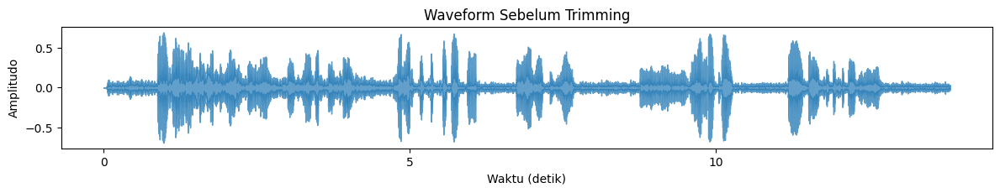

In [ ]:
# === Plot sebelum dan sesudah ===
plt.figure(figsize=(12, 4))
plt.subplot(2, 1, 1)
librosa.display.waveshow(y, sr=sr, alpha=0.7)
plt.title("Waveform Sebelum Trimming")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.tight_layout()
plt.show()

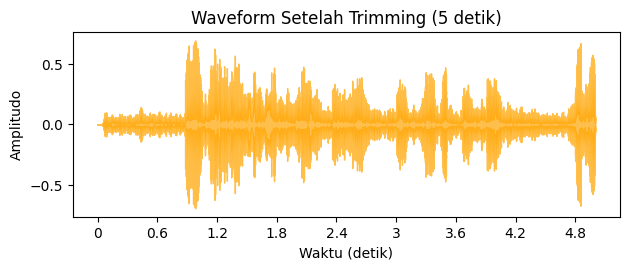

In [ ]:
plt.subplot(2, 1, 2)
librosa.display.waveshow(y_trimmed, sr=sr, alpha=0.7, color='orange')
plt.title("Waveform Setelah Trimming (5 detik)")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")

plt.tight_layout()
plt.show()

# === Putar hasil trimming ===
print(" ")
Audio(y_trimmed, rate=sr)

##### 2. Padding

Padding dilakukan agar audio yang durasinya lebih pendek dari target punya panjang yang sama dengan audio lain.
Biasanya dilakukan dengan menambahkan nilai nol (silence) di akhir sinyal.

###### Load audio

In [ ]:
# === Load audio ===
y, sr = librosa.load("/content/audio.mp3", sr=None)

In [ ]:
# Target durasi (misalnya 5 detik)
target_duration = 15.0  # dalam detik
target_length = int(target_duration * sr)

In [ ]:
# === Padding ===
if len(y) < target_length:
    pad_width = target_length - len(y)
    y_padded = np.pad(y, (0, pad_width), mode='constant')
else:
    y_padded = y  # kalau sudah cukup panjang, tidak diubah

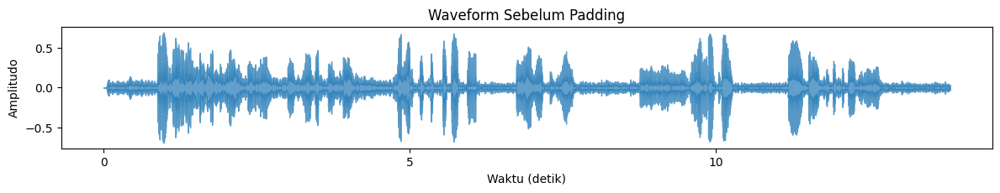

In [ ]:
plt.figure(figsize=(12, 4))
plt.subplot(2, 1, 1)
librosa.display.waveshow(y, sr=sr, alpha=0.7)
plt.title("Waveform Sebelum Padding")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.tight_layout()
plt.show()

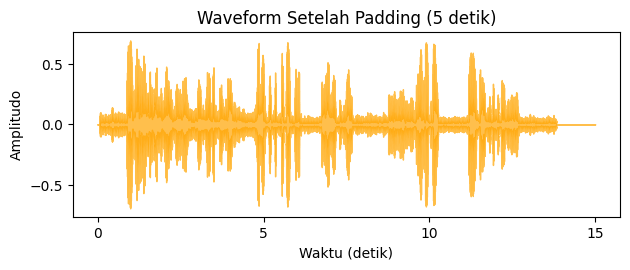

In [ ]:
plt.subplot(2, 1, 2)
librosa.display.waveshow(y_padded, sr=sr, alpha=0.7, color='orange')
plt.title("Waveform Setelah Padding (5 detik)")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")

plt.tight_layout()
plt.show()

# === Putar hasil padding ===
print(" ")
Audio(y_padded, rate=sr)

# Data Augmentation

Dokumentasi bisa dilihat disini [Link](https://blog.pangeanic.com/audio-data-augmentation-techniques-and-methods)

### 1. Time Stretching

Time stretching adalah proses mengubah kecepatan (tempo) audio tanpa mengubah tinggi nada (pitch).

In [ ]:
y, sr = librosa.load("/content/audio.mp3", sr=None)

In [ ]:
# === Fungsi bantu untuk menampilkan waveform ===
def plot_waveform(y, sr, title="Waveform"):
    plt.figure(figsize=(10, 3))
    librosa.display.waveshow(y, sr=sr)
    plt.title(title)
    plt.xlabel("Waktu (detik)")
    plt.ylabel("Amplitudo")
    plt.tight_layout()
    plt.show()

In [ ]:
# === Fungsi bantu untuk menampilkan audio ===
def preview_audio(y, sr):
    return Audio(y, rate=sr)


Time Stretched Audio (1.2x lebih cepat):
 


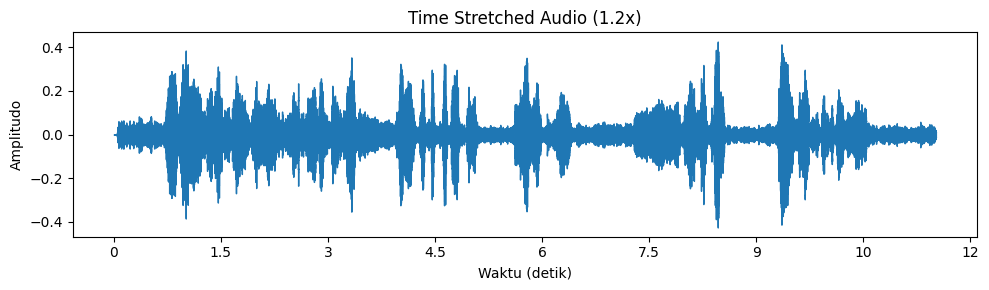


Pitch Shifted Audio (+2 Semitone):
 


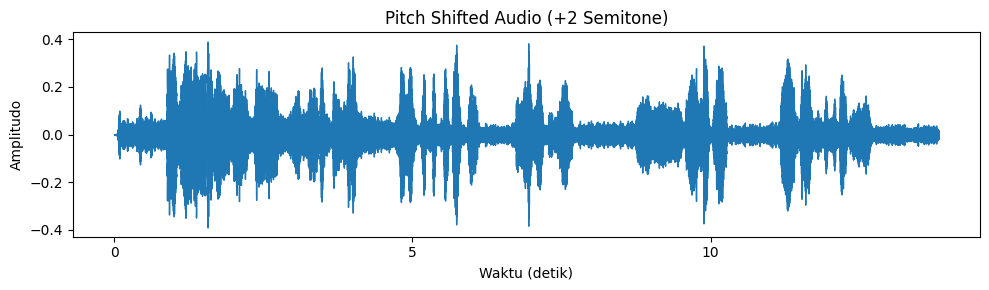

In [ ]:

# === 1. Time Stretching ===
# Rate > 1 = mempercepat, Rate < 1 = memperlambat
rate = 1.2  # contoh: 1.2x lebih cepat (20% lebih cepat)
y_stretched = librosa.effects.time_stretch(y, rate=rate)

print(f"\nTime Stretched Audio ({rate}x lebih cepat):")
print(" ")
plot_waveform(y_stretched, sr, title=f"Time Stretched Audio ({rate}x)")
print(" ")
display(preview_audio(y_stretched, sr))

# === 2. Pitch Shifting ===
# n_steps = jumlah semitone (positif = naik, negatif = turun)
n_steps = 2  # contoh: naik 2 semitone
y_shifted = librosa.effects.pitch_shift(y, sr=sr, n_steps=n_steps)

print(f"\nPitch Shifted Audio (+{n_steps} Semitone):")
print(" ")
plot_waveform(y_shifted, sr, title=f"Pitch Shifted Audio (+{n_steps} Semitone)")
print(" ")
display(preview_audio(y_shifted, sr))

# Feature Ektraksi

### 1. MFCC (Mel-Frequency Cepstral Coefficients)

MFCC adalah fitur yang meniru cara telinga manusia mendengar suara.

Suara manusia (dan kebanyakan suara alami) tidak didengar secara linear terhadap frekuensi — kita lebih sensitif terhadap perbedaan nada rendah (bass) dibanding nada tinggi.
Karena itu, MFCC menggunakan skala Mel, yaitu skala frekuensi yang menyerupai persepsi manusia.

In [ ]:
# === 1. Load Audio ===
y, sr = librosa.load("/content/audio.mp3", sr=None)

In [ ]:
# === 2. Ekstraksi MFCC ===
mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

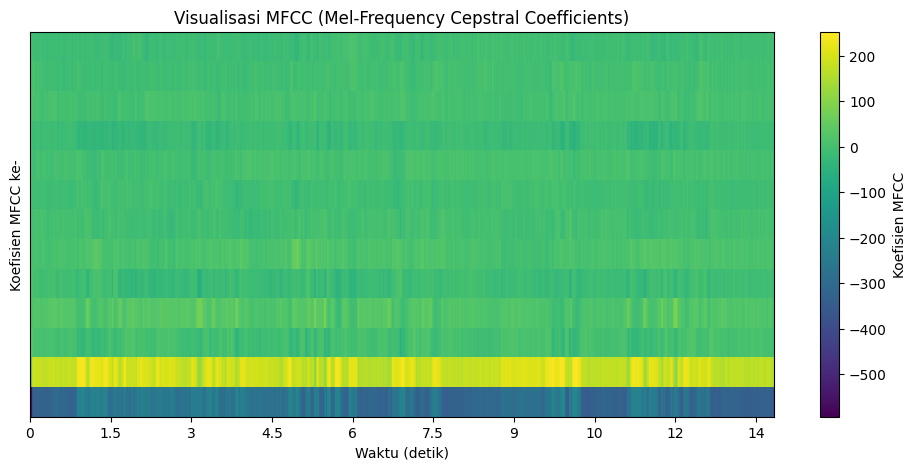

In [ ]:
# === 3. Tampilkan MFCC ===
plt.figure(figsize=(12, 5))
librosa.display.specshow(mfcc, x_axis='time', sr=sr, cmap='viridis')

plt.colorbar(label='Koefisien MFCC')
plt.title('Visualisasi MFCC (Mel-Frequency Cepstral Coefficients)')
plt.xlabel('Waktu (detik)')
plt.ylabel('Koefisien MFCC ke-')
plt.show()

# === 4. Dengarkan Audio ===
print(" ")
Audio(y, rate=sr)

# Tugas

Tujuan

Mahasiswa mampu melakukan tahap prapemrosesan sinyal audio sebelum masuk ke tahap feature extraction menggunakan Python (Librosa) di Google Colab.

Gunakan Google Colab untuk mengerjakan tugas ini. Data audio telah disediakan oleh dosen.
Format pengerjaan mengikuti file template .ipynb ini: [Tugas](https://colab.research.google.com/drive/1ZoyjAzzkMjB1EVv8Zzs1yYOCM5sSsnCL?usp=sharing)

Setelah selesai, kumpulkan

Link file .ipynb Google Colab

# **Referensi :**

1. https://www.homebrewaudio.com/24032/audio-normalization-care/?source=post_page-----9dbcedfefcc0---------------------------------------

2. https://medium.com/@poudelnipriyanka/audio-normalization-9dbcedfefcc0

3. https://en.wikipedia.org/wiki/Audio_normalization#Loudness_normalization

4. https://www.geeksforgeeks.org/data-analysis/preprocessing-the-audio-dataset/

5. https://huggingface-co.translate.goog/learn/audio-course/chapter1/audio_data?_x_tr_sl=en&_x_tr_tl=id&_x_tr_hl=id&_x_tr_pto=tc

6. https://huggingface.co/learn/audio-course/chapter1/preprocessing

7. https://docs.pytorch.org/audio/stable/tutorials/audio_resampling_tutorial.html

8. https://neutroncode.com/feature_resampling

9. https://service.ai-prompt.jp/en/article/ai365-136/

10. https://www.analyticsvidhya.com/blog/2017/08/audio-voice-processing-deep-learning/